In [1]:
import torch

# Check if CUDA (GPU support) is available
if torch.cuda.is_available():
    # Get the number of available GPUs
    gpu_count = torch.cuda.device_count()
    print(f"GPU is available with {gpu_count} device(s).")
else:
    print("GPU is not available.")


GPU is available with 1 device(s).


In [2]:
!git clone https://github.com/tobran/DF-GAN
!pip install -r DF-GAN/requirements.txt
!pip install gdown


Cloning into 'DF-GAN'...
remote: Enumerating objects: 249, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 249 (delta 47), reused 40 (delta 40), pack-reused 184
Receiving objects: 100% (249/249), 3.37 MiB | 17.34 MiB/s, done.
Resolving deltas: 100% (109/109), done.
ERROR: Could not find a version that satisfies the requirement torch==1.9.0 (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2, 2.2.0, 2.2.1)
ERROR: No matching distribution found for torch==1.9.0


# Prapare Data

In [3]:
# Download preprocessed metadata for Birds
import gdown

# The file ID is extracted from the Google Drive link
file_id = '1I6ybkR7L64K8hZOraEZDuHh0cCJw5OUj'
file_url = f'https://drive.google.com/uc?id={file_id}'

# Output file path
output_path = 'DF-GAN/data/birds_metadata.zip' # Path corrected for Google Colab

# Ensure the directories exist
import os
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Download the file
gdown.download(file_url, output_path, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1I6ybkR7L64K8hZOraEZDuHh0cCJw5OUj
From (redirected): https://drive.google.com/uc?id=1I6ybkR7L64K8hZOraEZDuHh0cCJw5OUj&confirm=t&uuid=a118e9d7-4bbe-4707-9f2d-d2ff48f8e26f
To: /content/DF-GAN/data/birds_metadata.zip
100%|██████████| 132M/132M [00:00<00:00, 146MB/s]


'DF-GAN/data/birds_metadata.zip'

In [9]:
# The file ID extracted from your Google Drive link
file_id = '15Fw-gErCEArOFykW3YTnLKpRcPgI_3AB'
file_url = f'https://drive.google.com/uc?id={file_id}'

# Output file path within Colab environment
output_path = '/content/DF-GAN/data/coco_metadata.zip'

# Make sure the target directory exists, if not, create it
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Download the file to the specified output path
gdown.download(file_url, output_path, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=15Fw-gErCEArOFykW3YTnLKpRcPgI_3AB
From (redirected): https://drive.google.com/uc?id=15Fw-gErCEArOFykW3YTnLKpRcPgI_3AB&confirm=t&uuid=b370ef65-b24b-48c7-8553-144467cf0436
To: /content/DF-GAN/data/coco_metadata.zip
100%|██████████| 206M/206M [00:00<00:00, 258MB/s]


'/content/DF-GAN/data/coco_metadata.zip'

In [10]:
import zipfile

bird_metadata_path = '/content/DF-GAN/data/birds_metadata.zip'
coco_metadata_path = '/content/DF-GAN/data/coco_metadata.zip'
with zipfile.ZipFile(bird_metadata_path, 'r') as zip_ref:
    zip_ref.extractall('/content/DF-GAN/data/')
with zipfile.ZipFile(coco_metadata_path, 'r') as zip_ref:
    zip_ref.extractall('/content/DF-GAN/data/')

In [6]:
#Downloading image
# Ensure the data/birds directory exists
!mkdir -p /content/DF-GAN/data/birds

# Download the dataset using wget
!wget -O /content/DF-GAN/data/CUB_200_2011.tgz https://data.caltech.edu/records/65de6-vp158/files/CUB_200_2011.tgz?download=1

# Extract the contents of the .tgz file
!tar -xvzf /content/DF-GAN/data/CUB_200_2011.tgz -C /content/DF-GAN/data/birds

Streaming output truncated to the last 5000 lines.
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0050_111087.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0079_113288.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0004_111989.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0068_113247.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0127_111935.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0094_112773.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0028_113217.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0126_110959.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0007_111029.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0096_111519.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0120_113001.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0010_112678.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0025_111669.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0084_111300.j

In [19]:
!mkdir -p /content/DF-GAN/data/coco/images
!wget -O /content/DF-GAN/data/train2017.zip http://images.cocodataset.org/zips/train2017.zip
!unzip -q /content/DF-GAN/data/train2017.zip -d /content/DF-GAN/data/coco/images

--2024-03-27 09:54:18--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.10.223, 3.5.28.207, 52.216.59.121, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.10.223|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘/content/DF-GAN/data/train2017.zip’

/content/DF-GAN/dat 100%[===================>]  18.01G  89.6MB/s    in 3m 24s  

2024-03-27 09:57:42 (90.5 MB/s) - ‘/content/DF-GAN/data/train2017.zip’ saved [19336861798/19336861798]



In [15]:
%cd /content/DF-GAN/code


/content/DF-GAN/code


# Training

In the yaml file, there are several hyperparameter to adjust such as 
- `imsize`: Image size (e.g., 256x256 pixels).
- `z_dim`: Dimensionality of the noise vector (e.g., 100).
- `cond_dim`: Dimensionality of the conditional input (e.g., 256).
- `batch_size`: Number of samples processed in each training iteration (e.g., 32).
- `nf`: Number of filters in the first layer of the generator and discriminator networks.
- `max_epoch`: Maximum number of training epochs (e.g., 1301).
- `trunc_rate`: Truncation rate for truncation trick (e.g., 0.88).
- `sample_times`: Number of times to sample images during evaluation (e.g., 10).
- `WORDS_NUM`: Number of words in each textual input (e.g., 18).
- `EMBEDDING_DIM`: Dimensionality of the word embeddings (e.g., 256).
- `CAPTIONS_PER_IMAGE`: Number of captions per image in the dataset (e.g., 10).


In [17]:
!bash scripts/train.sh ./cfg/bird.yml


/usr/local/lib/python3.10/dist-packages/torch/distributed/launch.py:183: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use-env is set by default in torchrun.
If your script expects `--local-rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  warnings.warn(
2024-03-27 09:36:16.165370: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-27 09:36:16.165426: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-27 09:36:16.166825: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to regis

In [22]:
!bash scripts/train.sh ./cfg/coco.yml


/usr/local/lib/python3.10/dist-packages/torch/distributed/launch.py:183: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use-env is set by default in torchrun.
If your script expects `--local-rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  warnings.warn(
2024-03-27 10:16:13.601017: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-27 10:16:13.601070: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-27 10:16:13.602421: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to regis

# Sampling the with Pre-trained Data

In [23]:
# Create the target directory if it doesn't exist
!mkdir -p /content/DF-GAN/code/saved_models/bird/
!mkdir -p /content/DF-GAN/code/saved_models/coco/


# Use gdown to download the file from Google Drive
!gdown --id 1rzfcCvGwU8vLCrn5reWxmrAMms6WQGA6 -O /content/DF-GAN/code/saved_models/bird/
!gdown --id '1e_AwWxbClxipEnasfz_QrhmLlv2-Vpyq' -O '/content/DF-GAN/code/saved_models/coco/'



/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1rzfcCvGwU8vLCrn5reWxmrAMms6WQGA6
From (redirected): https://drive.google.com/uc?id=1rzfcCvGwU8vLCrn5reWxmrAMms6WQGA6&confirm=t&uuid=11190c52-6402-4014-8cf2-274f2fca3325
To: /content/DF-GAN/code/saved_models/bird/pretrained_bird.zip
100% 183M/183M [00:01<00:00, 150MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1e_AwWxbClxipEnasfz_QrhmLlv2-Vpyq
From (redirected): https://drive.google.com/uc?id=1e_AwWxbClxipEnasfz_QrhmLlv2-Vpyq&confirm=t&uuid=cd3d2d51-11c2-4d5f-a442-256881f02ffc
T

In [24]:
!unzip /content/DF-GAN/code/saved_models/bird/pretrained_bird.zip -d /content/DF-GAN/code/saved_models/
!unzip /content/DF-GAN/code/saved_models/coco/pretrained_coco.zip -d /content/DF-GAN/code/saved_models/


Archive:  /content/DF-GAN/code/saved_models/bird/pretrained_bird.zip
  inflating: /content/DF-GAN/code/saved_models/__MACOSX/._bird  
  inflating: /content/DF-GAN/code/saved_models/bird/.DS_Store  
  inflating: /content/DF-GAN/code/saved_models/__MACOSX/bird/._.DS_Store  
   creating: /content/DF-GAN/code/saved_models/bird/pretrained/
  inflating: /content/DF-GAN/code/saved_models/__MACOSX/bird/._pretrained  
  inflating: /content/DF-GAN/code/saved_models/bird/pretrained/state_epoch_1220.pth  
  inflating: /content/DF-GAN/code/saved_models/__MACOSX/bird/pretrained/._state_epoch_1220.pth  
Archive:  /content/DF-GAN/code/saved_models/coco/pretrained_coco.zip
  inflating: /content/DF-GAN/code/saved_models/__MACOSX/._coco  
   creating: /content/DF-GAN/code/saved_models/coco/pretrained/
  inflating: /content/DF-GAN/code/saved_models/__MACOSX/coco/._pretrained  
  inflating: /content/DF-GAN/code/saved_models/coco/pretrained/state_epoch_290.pth  
  inflating: /content/DF-GAN/code/saved_model

Sample for bird dataset

In [30]:
!bash scripts/sample.sh ./cfg/bird.yml

Load from:  ../data/birds/captions_DAMSM.pickle
/usr/local/lib/python3.10/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
Load ./saved_models/bird/pretrained/state_epoch_1220.pth for NetG
************ Start sampling ************
****************************************
100% 26/26 [00:17<00:00,  1.46it/s]
****************************************
Sampling done, 18.92s cost, saved to ./samples/bird/2024_03_27_10_32_09
*******

Caption: this bird has an orange bill, a white belly and white eyebrows.


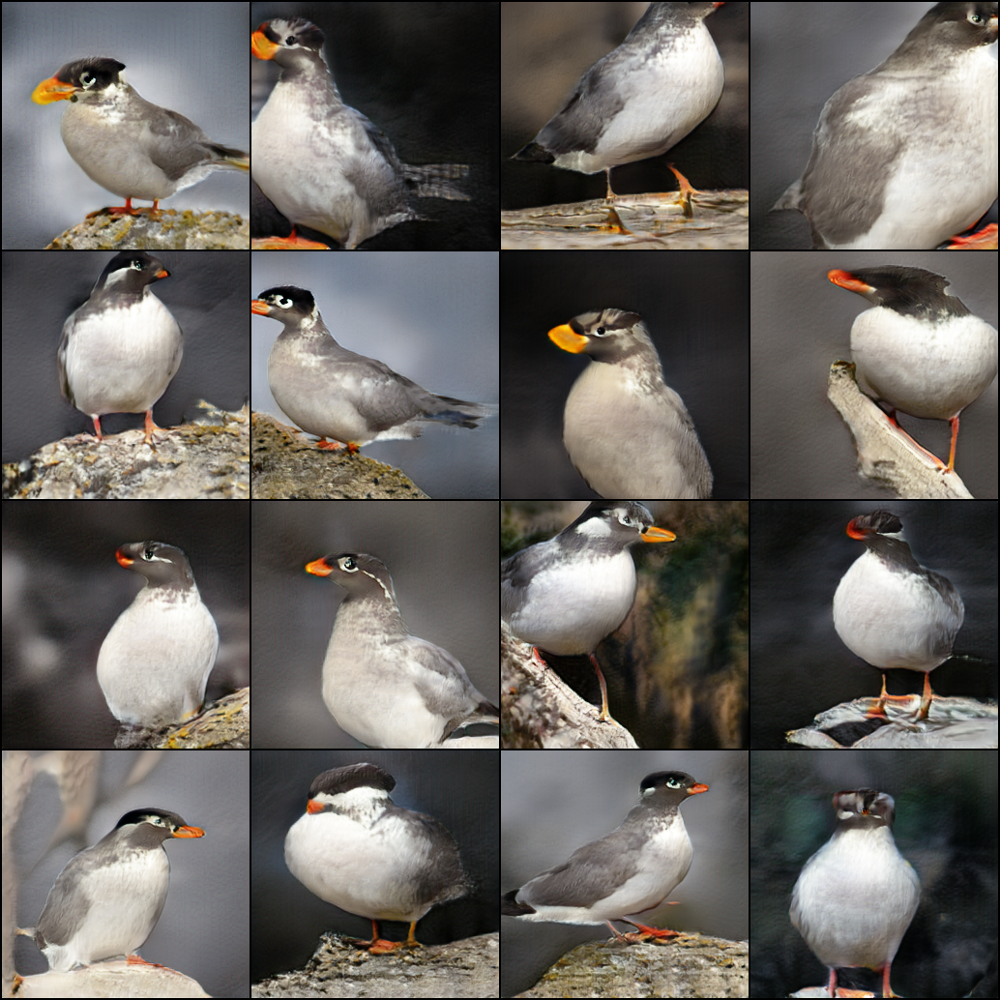

In [31]:
from IPython.display import Image, display

print("Caption: this bird has an orange bill, a white belly and white eyebrows.")


# Specify the exact path to your image
image_path = '/content/DF-GAN/code/samples/bird/2024_03_27_10_32_09/Sent001.png'

# Display the image
display(Image(filename=image_path))



Caption: this bird had brown primaries, a brown crown, and white belly.


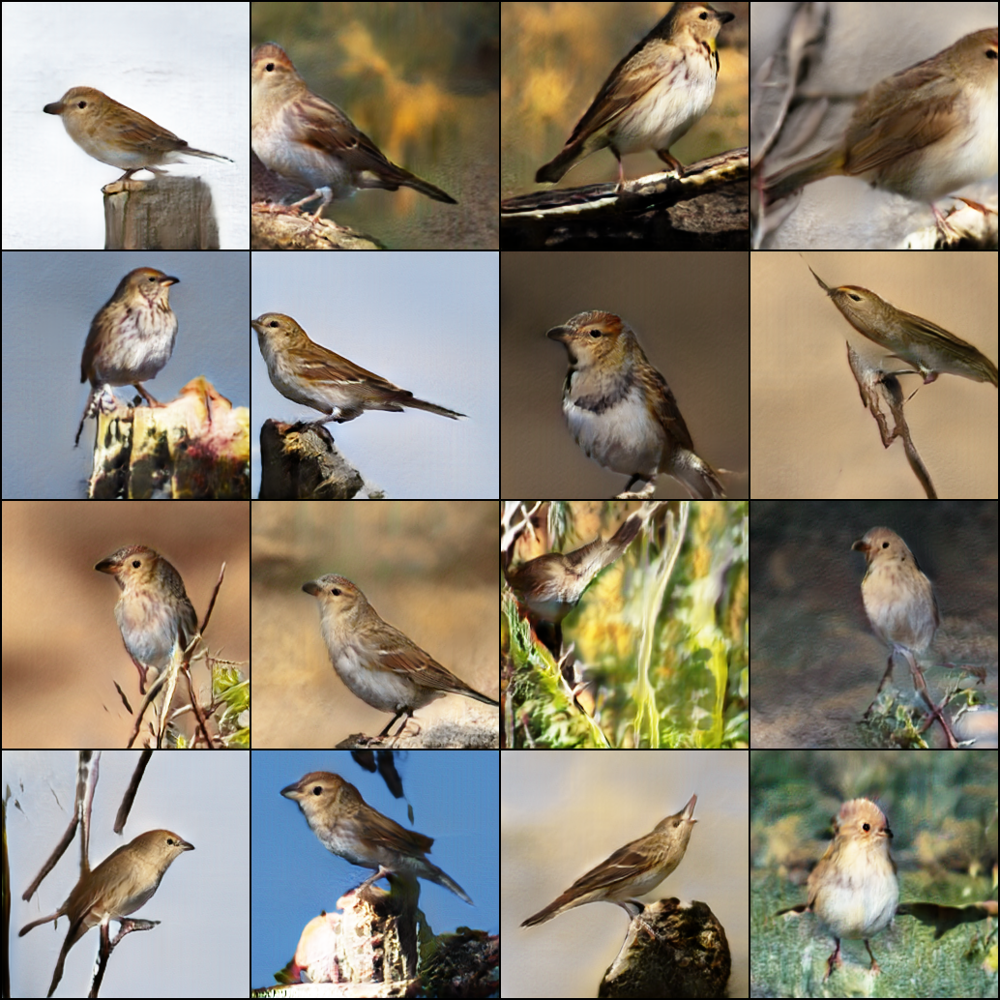

In [32]:
print("Caption: this bird had brown primaries, a brown crown, and white belly.")

# Specify the exact path to your image
image_path = '/content/DF-GAN/code/samples/bird/2024_03_27_10_32_09/Sent002.png'

# Display the image
display(Image(filename=image_path))

Caption: this is a grey bodied bird with light grey wings and a white breast.


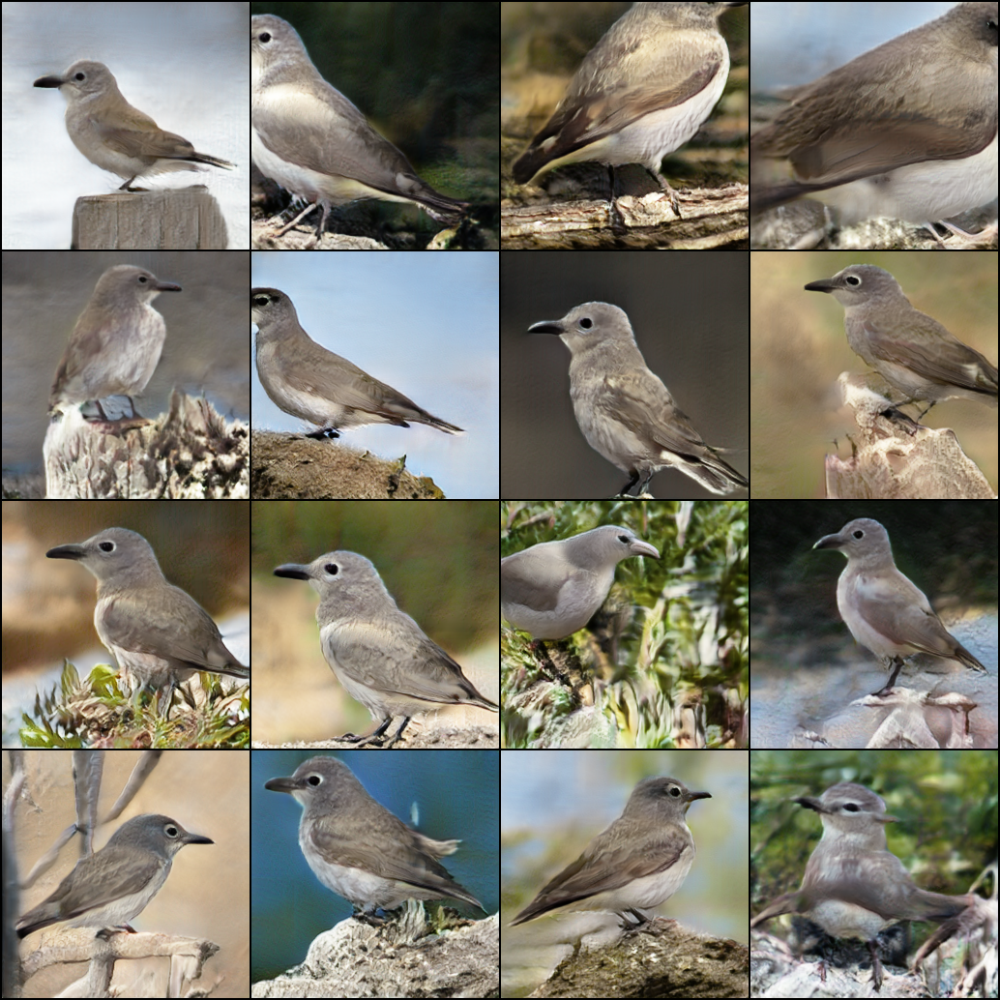

In [30]:
print("Caption: this is a grey bodied bird with light grey wings and a white breast.")
# Specify the exact path to your image
image_path = '/content/DF-GAN/code/samples/bird/2024_03_27_06_38_30/Sent003.png'

# Display the image
display(Image(filename=image_path))

Sample of COCO dataset

In [34]:
!bash scripts/sample.sh ./cfg/coco.yml

Load from:  ../data/coco/captions_DAMSM.pickle
/usr/local/lib/python3.10/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
Load ./saved_models/coco/pretrained/state_epoch_290.pth for NetG
************ Start sampling ************
****************************************
100% 62/62 [00:35<00:00,  1.74it/s]
****************************************
Sampling done, 36.84s cost, saved to ./samples/coco/2024_03_27_10_38_01
*********

Caption: The skiers are standing next to a large crowd.


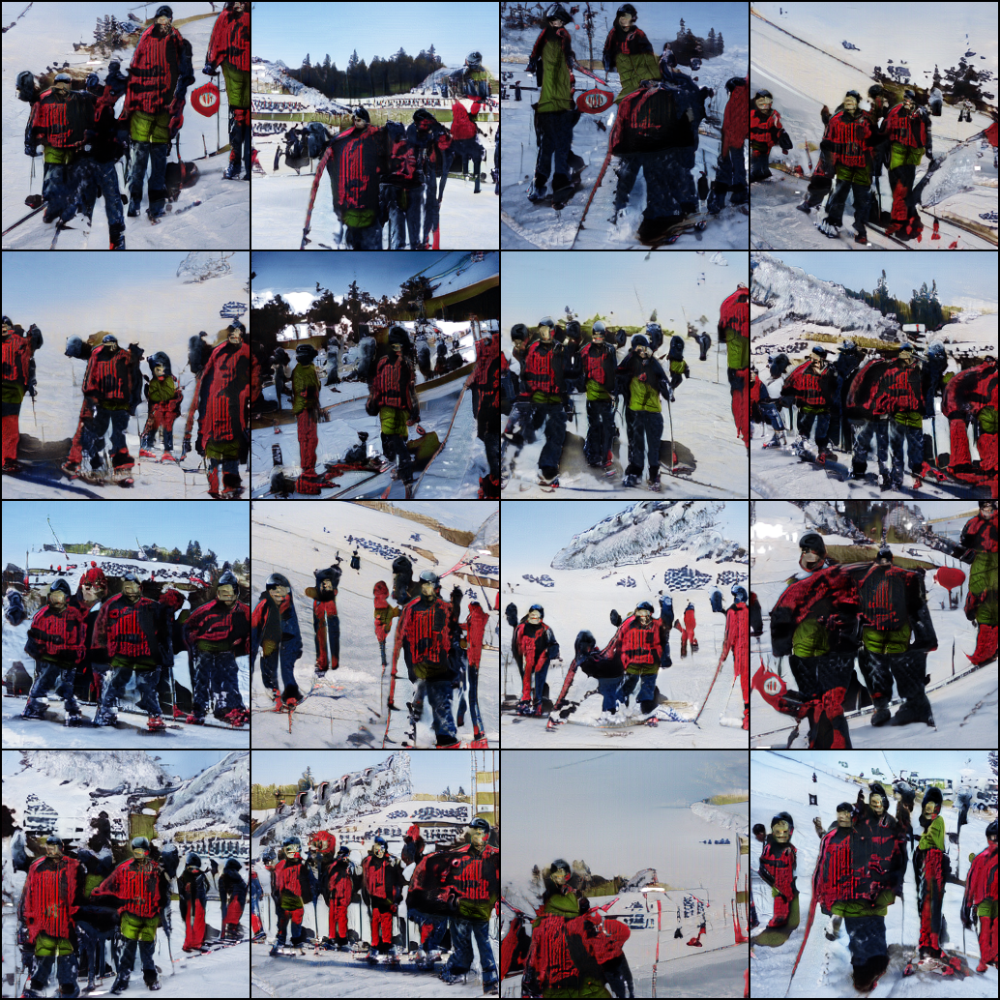

In [35]:
print("Caption: The skiers are standing next to a large crowd.")

# Specify the exact path to your image
image_path = '/content/DF-GAN/code/samples/coco/2024_03_27_10_38_01/Sent001.png'
# Display the image
display(Image(filename=image_path))

Caption: On the plate is eggs,tomatoes sausage, and some bacon.


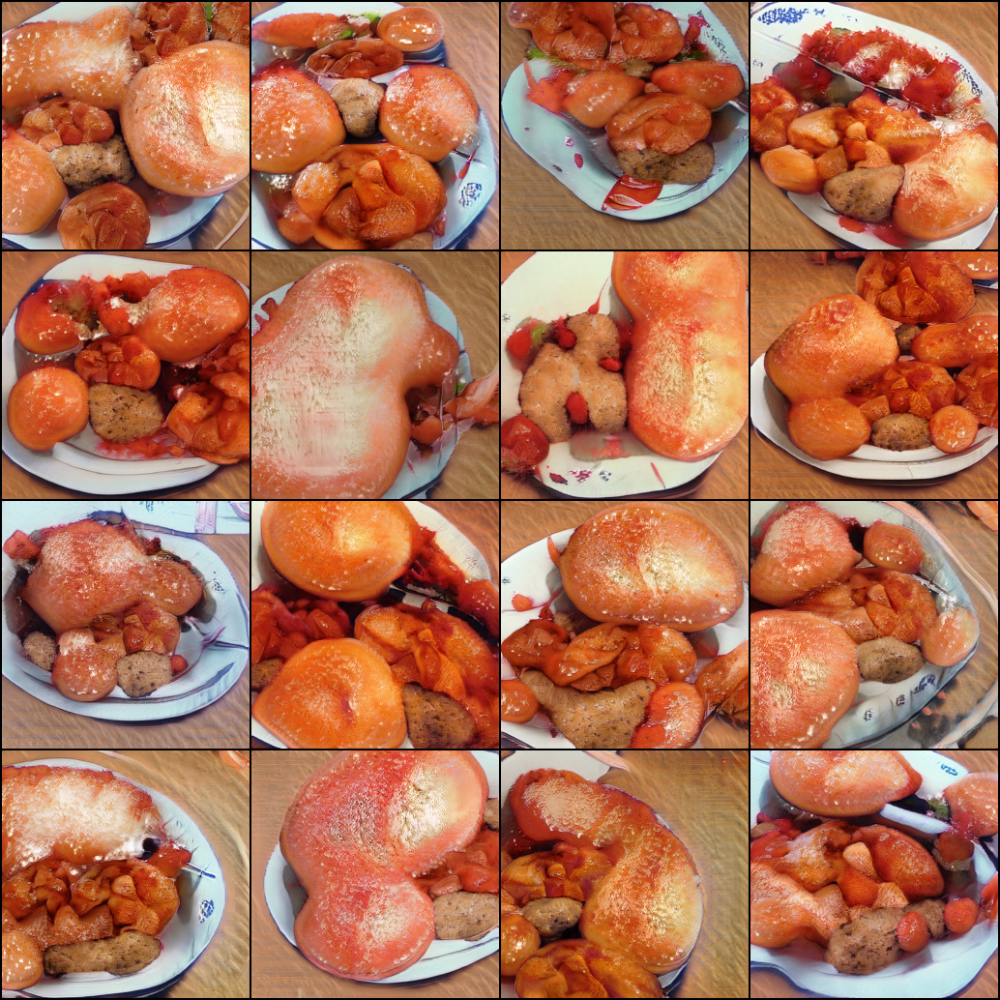

In [38]:
print("Caption: On the plate is eggs,tomatoes sausage, and some bacon.")

# Specify the exact path to your image
image_path = '/content/DF-GAN/code/samples/coco/2024_03_27_10_38_01/Sent004.png'
# Display the image
display(Image(filename=image_path))

# Evaluation

In [40]:
!bash /content/DF-GAN/code/scripts/calc_fid.sh /content/DF-GAN/code/cfg/bird.yml

/usr/local/lib/python3.10/dist-packages/torch/distributed/launch.py:183: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use-env is set by default in torchrun.
If your script expects `--local-rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  warnings.warn(
2024-03-27 07:02:50.011882: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-27 07:02:50.011931: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-27 07:02:50.013188: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to regis